In [54]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from numba import jit

import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

# set Jupyter to display ALL output from a cell (not just last output)
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" 

# set pandas and numpy options to make print format nicer
pd.set_option("display.width",100)
pd.set_option("display.max_columns",1000)
pd.set_option('display.max_colwidth', 80)
pd.set_option('display.max_rows', 500)
np.set_printoptions(linewidth=100, threshold=5000, edgeitems=10, suppress=True)

seed=2319

In [55]:
%%time
train_orig = pd.read_csv('train.csv.zip')
test_orig  = pd.read_csv('test.csv.zip')
train_orig.head()

CPU times: user 15.2 s, sys: 1.31 s, total: 16.5 s
Wall time: 18.4 s


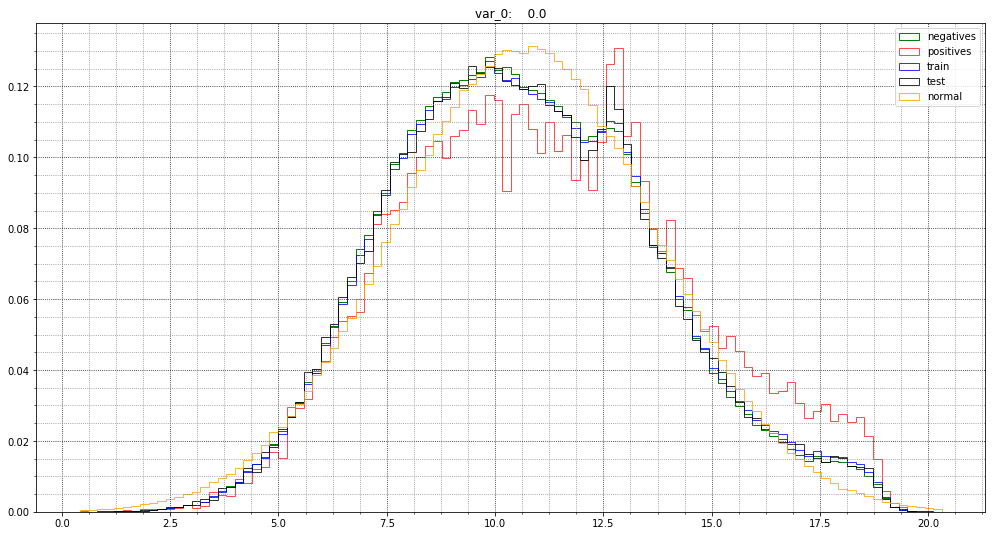

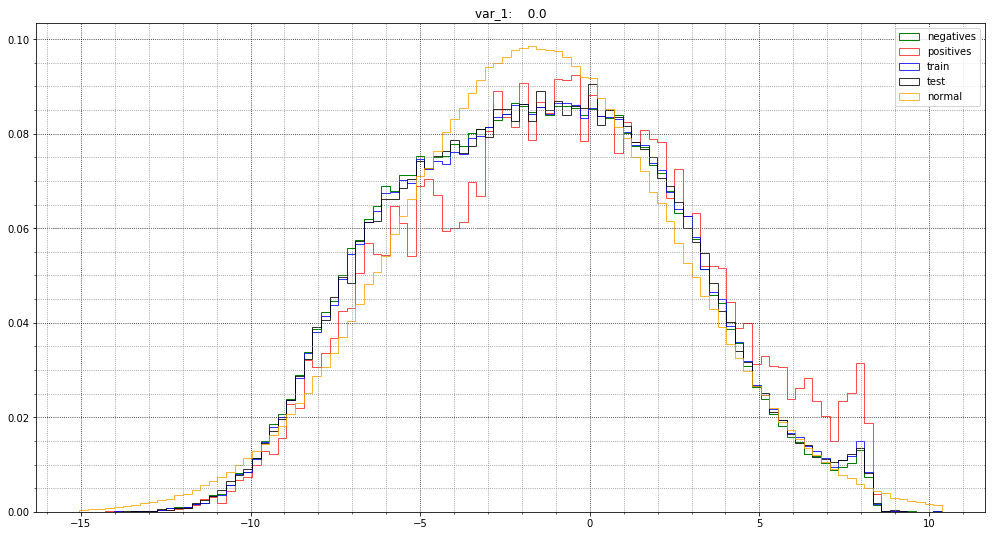

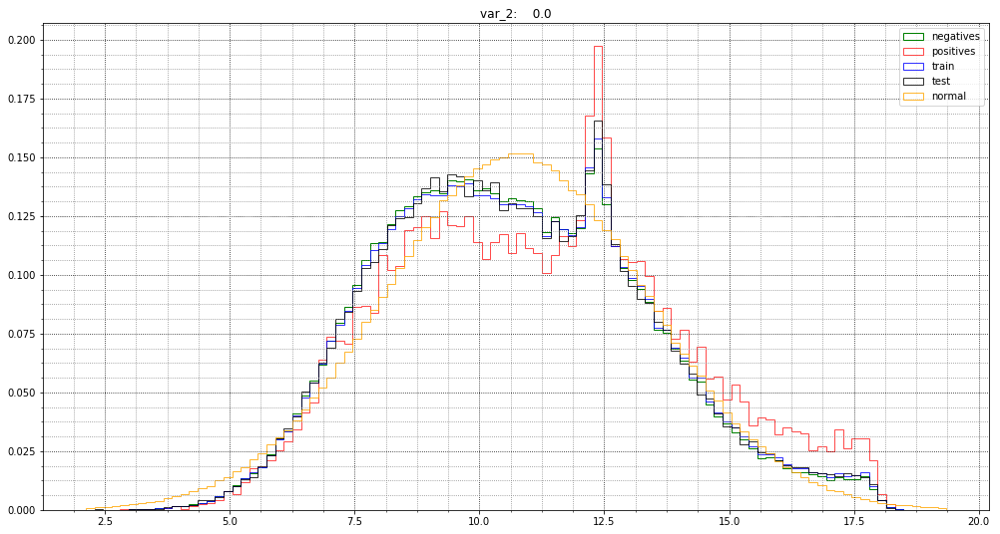

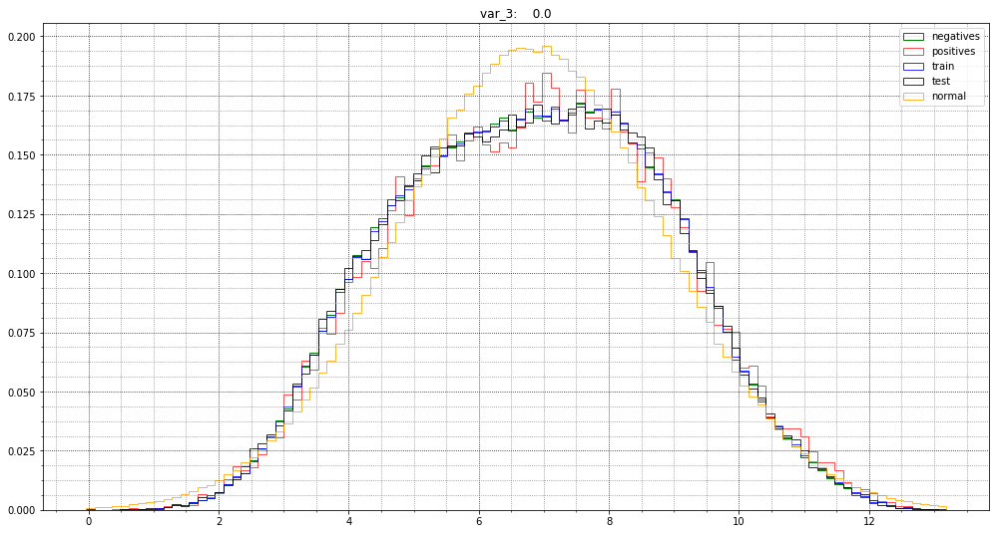

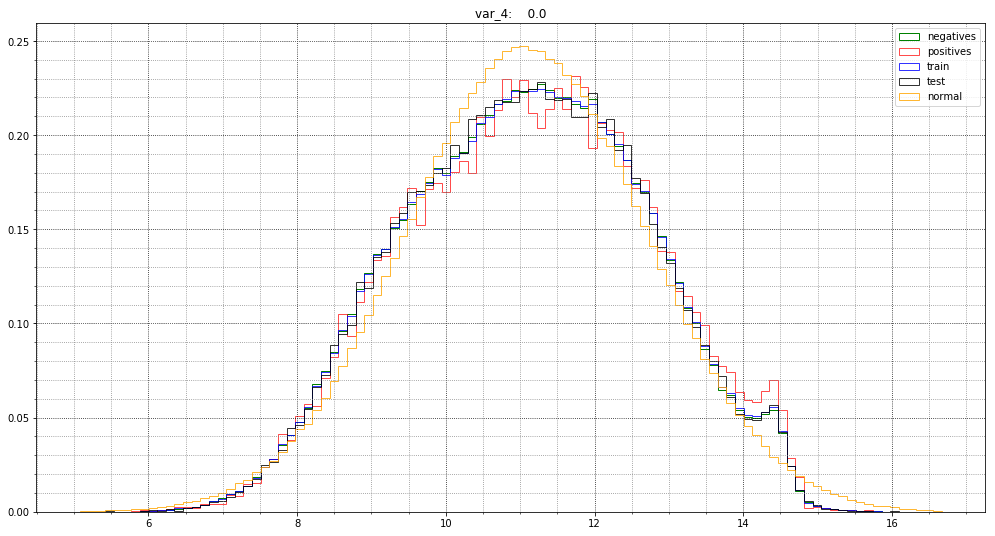

...

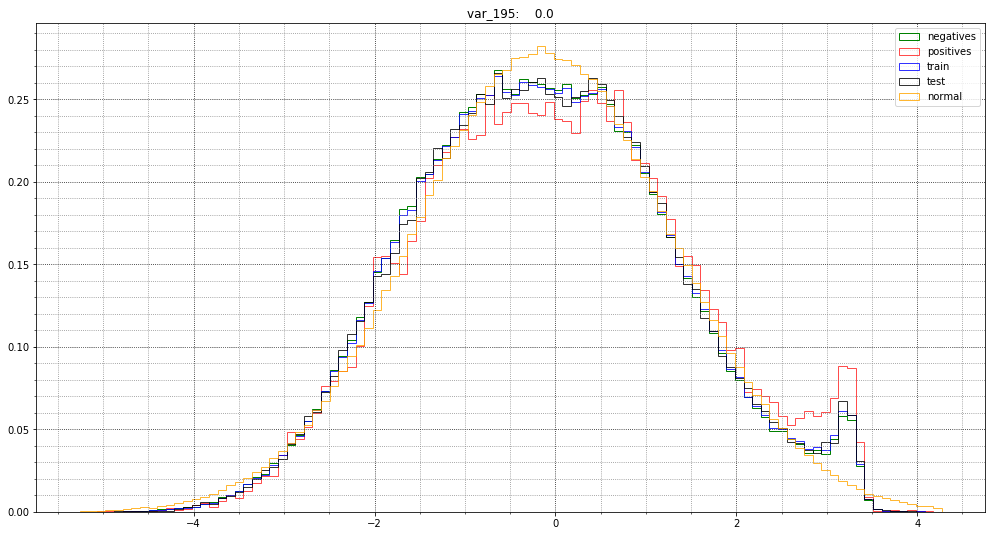

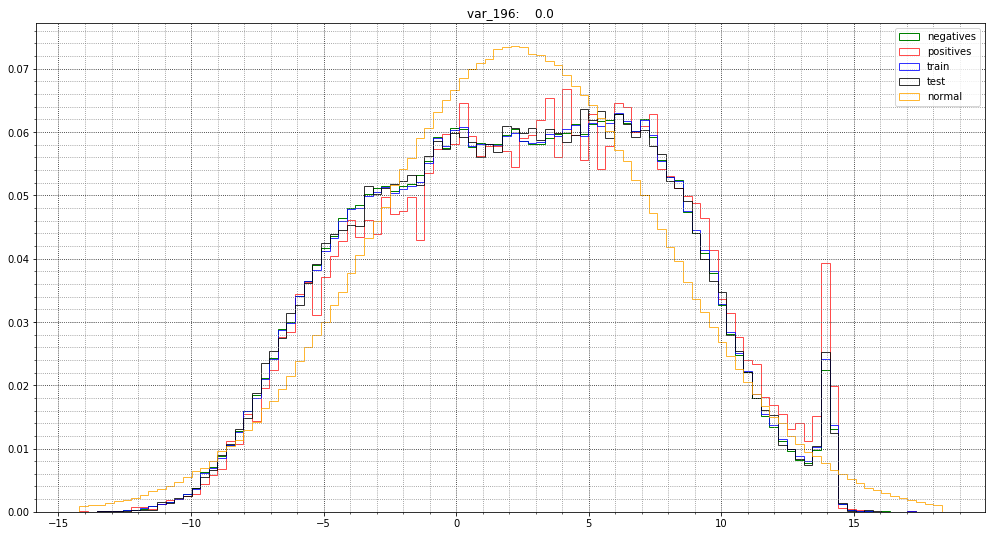

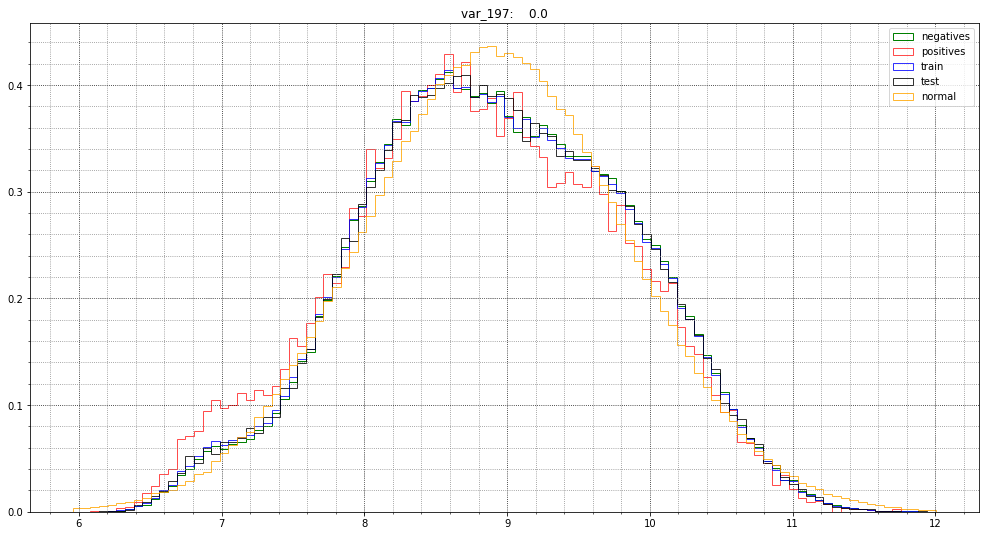

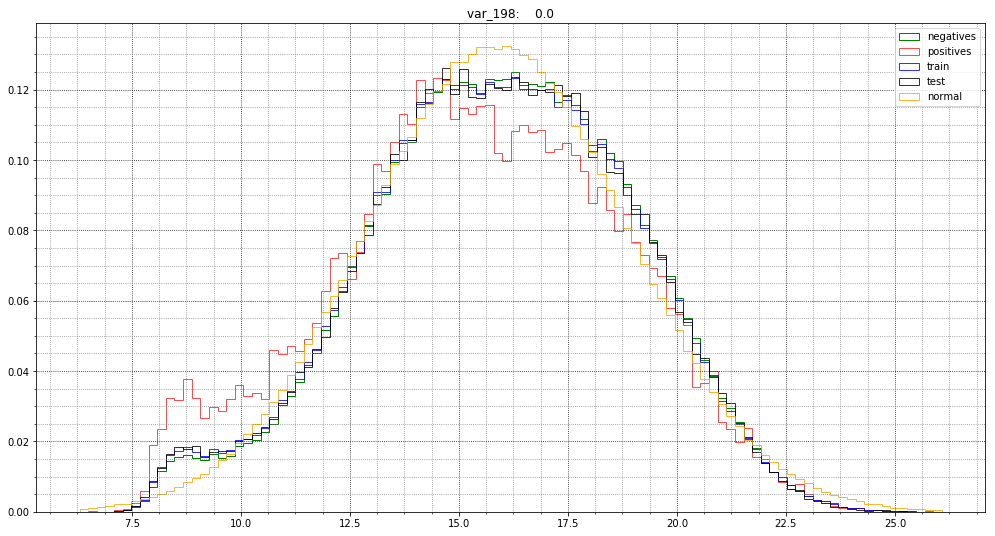

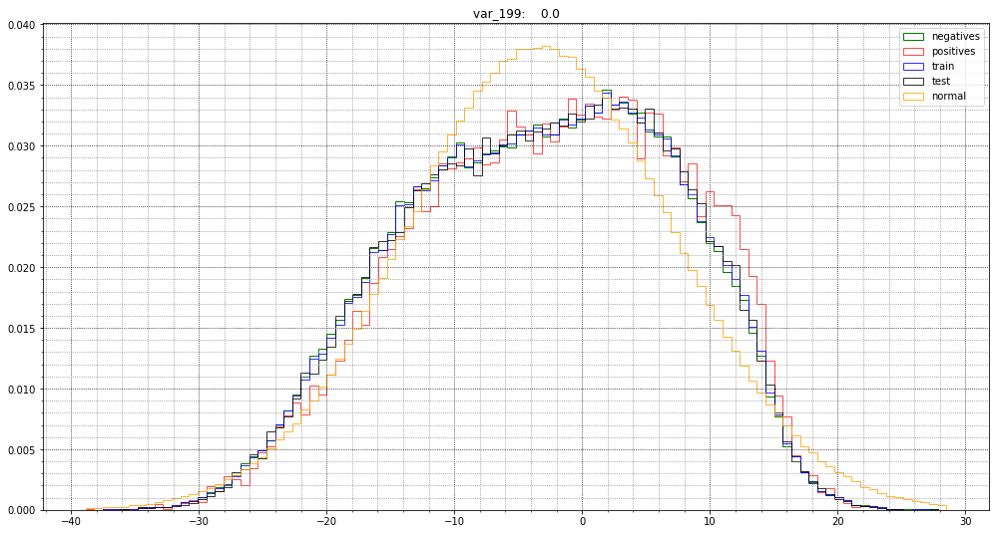

In [79]:
np.random.seed(seed)
train = train_orig.copy()
test  = test_orig.copy()
bins=100
features = [c for c in train.columns if c not in ['ID_code', 'target']]

pvalue = dict()
for var in features:
    _ = plt.figure(figsize=(17,9))
#     _ = plt.subplot(1,2,1)
    negatives = train.loc[train.target==0, var]
    positives = train.loc[train.target==1, var]
    mean_ = train[var].mean()
    sd_ = train[var].std()
    normals = np.random.normal(mean_, sd_, 1000000)
    
    pvalue[var] = (ttest_ind(positives, negatives).pvalue, train[var].skew())
    
    _ = plt.minorticks_on()
    _ = plt.title(var+':    '+str(np.round(pvalue[var][0],4)) )
    neg = plt.hist(negatives, bins=bins, density=True, histtype='step', alpha=1, color='green',
                   label='negatives',range=(train[var].min(),train[var].max()))
    pos = plt.hist(positives, bins=bins, density=True, histtype='step', alpha=0.7, color='red',
                   label='positives',range=(train[var].min(),train[var].max()))
    trn = plt.hist(train[var], bins=bins, density=True, histtype='step', alpha=0.8, color='blue',
                   label='train',range=(train[var].min(),train[var].max()))
    tst = plt.hist(test[var], bins=bins, density=True, histtype='step', alpha=0.8, color='black',
                   label='test',range=(train[var].min(),train[var].max()))
    std = plt.hist(normals, bins=bins, density=True, histtype='step', alpha=0.8, color='orange',
                   label='normal',range=(train[var].min(),train[var].max()))
    _ = plt.legend(loc='upper right')
#     _ = plt.grid()
    _ = plt.grid(which='major', linestyle=':', color='black')
    _ = plt.grid(which='minor', linestyle=':', color='grey')
#     _ = plt.subplot(1,2,2)
#     _ = plt.plot(neg[1][:-1], np.abs((neg[0]-pos[0])/np.max(np.abs(neg[0]))))
#     _ = plt.grid()
    _ = plt.show()
    


In [74]:
%%time
train = train_orig.copy()
test  = test_orig.copy()
np.random.seed(seed)

for data in [train, test]:
    data['var_53a'] = data['var_53'] < 6 # IMPROVES!!
#     data['var_0a'] = data['var_0'] >15.5
#     data['var_1a'] = data['var_1'] >5
#     data['var_2a'] = data['var_2'] >12.3
#     data['var_6a'] = data['var_6'] >6.4
#     data['var_12_53'] = (data['var_12'] <13.64) & (data['var_53'] < 6) & (data['var_81'] < 12.1)
#     data['var_13a'] = data['var_13'] <5
#     data['var_21a'] = data['var_21'] <9

features = [c for c in train.columns if c not in ['ID_code', 'target','var_136']]
target = train['target']

param = {
    'bagging_freq': 5,          
    'bagging_fraction': 0.331,   'boost_from_average':'false',   
    'boost': 'gbdt', 'feature_fraction': 0.0405, 'learning_rate': 0.0083,
    'max_depth': -1, 'metric':'auc', 'min_data_in_leaf': 80,     'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13, 'num_threads': 8, 'tree_learner': 'serial',   'objective': 'binary', 'verbosity': 1
}

folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
trn_idx, val_idx = next(folds.split(train.values, target.values))

print('Start Training', features)
trn_data = lgb.Dataset(train.iloc[trn_idx][features], label=target.iloc[trn_idx])
val_data = lgb.Dataset(train.iloc[val_idx][features], label=target.iloc[val_idx])

clf = lgb.train(param, trn_data, 1000000, valid_sets = [trn_data, val_data], 
                verbose_eval=5000, early_stopping_rounds = 4000)
oof = clf.predict(train.iloc[val_idx][features], num_iteration=clf.best_iteration)
# predictions  = clf.predict(test[features], num_iteration=clf.best_iteration)

AUC = roc_auc_score(train.iloc[val_idx].target, oof)
print("AUC score: {:<8.5f}".format(AUC),'\n')

# sub = pd.DataFrame({"ID_code": test.ID_code.values})
# sub["target"] = predictions
# sub.to_csv("submission_rangeflags.csv", index=False)

Start Training ['var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_9', 'var_10', 'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var_18', 'var_19', 'var_20', 'var_21', 'var_22', 'var_23', 'var_24', 'var_25', 'var_26', 'var_27', 'var_28', 'var_29', 'var_30', 'var_31', 'var_32', 'var_33', 'var_34', 'var_35', 'var_36', 'var_37', 'var_38', 'var_39', 'var_40', 'var_41', 'var_42', 'var_43', 'var_44', 'var_45', 'var_46', 'var_47', 'var_48', 'var_49', 'var_50', 'var_51', 'var_52', 'var_53', 'var_54', 'var_55', 'var_56', 'var_57', 'var_58', 'var_59', 'var_60', 'var_61', 'var_62', 'var_63', 'var_64', 'var_65', 'var_66', 'var_67', 'var_68', 'var_69', 'var_70', 'var_71', 'var_72', 'var_73', 'var_74', 'var_75', 'var_76', 'var_77', 'var_78', 'var_79', 'var_80', 'var_81', 'var_82', 'var_83', 'var_84', 'var_85', 'var_86', 'var_87', 'var_88', 'var_89', 'var_90', 'var_91', 'var_92', 'var_93', 'var_94', 'var_95', 'var_96', 'var_97', 'var_98', 'var

## Naive Bayes method (needs tuning)

In [108]:

train = train_orig.copy()
test  = test_orig.copy()
np.random.seed(seed)

for data in [train, test]:
    data['var_53a'] = (data['var_53'] < 6).astype(int)

train0 = train[ train['target']==0 ].copy()
train1 = train[ train['target']==1 ].copy()

# CALCULATE MEANS AND STANDARD DEVIATIONS
s = [0]*200
m = [0]*200
for i in range(200):
    s[i] = np.std(train['var_'+str(i)])
    m[i] = np.mean(train['var_'+str(i)])
    
# CALCULATE PROB(TARGET=1 | X)
def getp(i,x):
    c = smoothing #smoothing factor
    a = len( train1[ (train1['var_'+str(i)]>x-s[i]/c)&(train1['var_'+str(i)]<x+s[i]/c) ] ) 
    b = len( train0[ (train0['var_'+str(i)]>x-s[i]/c)&(train0['var_'+str(i)]<x+s[i]/c) ] )
    if a+b<500: return 0.1 #smoothing factor
    # RETURN PROBABILITY
    return a / (a+b)
    # ALTERNATIVELY RETURN ODDS
    # return a / b
    
# SMOOTH A DISCRETE FUNCTION
def smooth(x,st=1):
    for j in range(st):
        x2 = np.ones(len(x)) * 0.1
        for i in range(len(x)-2):
            x2[i+1] = 0.25*x[i]+0.5*x[i+1]+0.25*x[i+2]
        x = x2.copy()
    return x

def getp2(i,x):
    z = (x-m[i])/s[i]
    ss = (rmax-rmin)/(res-1)
    if res%2==0: 
        idx = min( (res+1)//2 + z//ss, res-1)
    else: 
        idx = min( (res+1)//2 + (z-ss/2)//ss, res-1)
    idx = max(idx,0)
    return pr[i,int(idx)]

In [107]:
np.linspace(4,10, 7)

array([ 4.,  5.,  6.,  7.,  8.,  9., 10.])

In [ ]:
%%time
# DRAW PLOTS, YES OR NO
Picture = False
# DATA HAS Z-SCORE RANGE OF -4.5 TO 4.5
rmin=-5; rmax=5; 
# CALCULATE PROBABILITIES FOR 501 BINS
res=501
# STORE PROBABILITIES IN PR
pr = 0.1 * np.ones((200,res))
pr2 = pr.copy()
xr = np.zeros((200,res))
xr2 = xr.copy()
ct2 = 0

for smoothing in np.linspace(4,10, 7):
    for j in range(50):
        ct2 = 0
#         if Picture: plt.figure(figsize=(15,8))
        for v in range(4):
            ct = 0
            # CALCULATE PROBABILITY FUNCTION FOR VAR
            for i in np.linspace(rmin,rmax,res):
                pr[v+4*j,ct] = getp(v+4*j,m[v+4*j]+i*s[v+4*j])
                xr[v+4*j,ct] = m[v+4*j]+i*s[v+4*j]
                xr2[v+4*j,ct] = i
                ct += 1
#             if Picture:
#                 # SMOOTH FUNCTION FOR PRETTIER DISPLAY
#                 # BUT USE UNSMOOTHED FUNCTION FOR PREDICTION
#                 pr2[v+4*j,:] = smooth(pr[v+4*j,:],res//10)
#                 # DISPLAY PROBABILITY FUNCTION
#                 plt.subplot(2, 4, ct2%4+5)
#                 plt.plot(xr[v+4*j,:],pr2[v+4*j,:],'-')
#                 plt.title('P( t=1 | var_'+str(v+4*j)+' )')
#                 xx = plt.xlim()
#                 # DISPLAY TARGET DENSITIES
#                 plt.subplot(2, 4, ct2%4+1)            
#                 sns.distplot(train0['var_'+str(v+4*j)], label = 't=0')
#                 sns.distplot(train1['var_'+str(v+4*j)], label = 't=1')
#                 plt.title('var_'+str(v+4*j))
#                 plt.legend()
#                 plt.xlim(xx)
#                 plt.xlabel('')
            if (ct2%20==0): print('Showing vars',ct2,'to',ct2+20,'...')
            ct2 += 1
#         if Picture: plt.show()

    print('Calculating 200000 predictions and displaying a few examples...')
    pred = [0]*200000; ct = 0
    for r in train.index:
        p = 0.1
        for i in range(200):
            p *= 10*getp2(i,train.iloc[r,2+i])
        if ct%10000==0: print('train',r,'has target =',train.iloc[r,1],'and prediction =',p)
        pred[ct]=p; ct += 1
    print('###############')
    print('Validation AUC =',roc_auc_score(train['target'], pred), 'smoothing', smoothing)

Showing vars 0 to 20 ...


In [93]:
# Validation AUC = 0.9055702103328558

In [105]:
print('Calculating 200000 predictions and displaying a few examples...')
pred = [0]*200000; ct = 0
for r in test.index:
    p = 0.1
    for i in range(200):
        p *= 10*getp2(i,test.iloc[r,1+i])
    if ct%25000==0: print('test',r,'has prediction =',p)
    pred[ct]=p
    ct += 1
    
sub = pd.DataFrame({"ID_code": test.ID_code.values})
sub['target'] = pred
sub.to_csv('submission_nbX.csv',index=False)
print('###############')
print('Finished. Wrote predictions to submission_NB_smooth.csv')

Calculating 200000 predictions and displaying a few examples...
test 0 has prediction = 0.227208479006305
test 25000 has prediction = 0.0818337969859523
test 50000 has prediction = 0.02614138225957156
test 75000 has prediction = 0.02402746021315957
test 100000 has prediction = 0.025577672656177178
test 125000 has prediction = 0.01894526280421573
test 150000 has prediction = 0.508851138653098
test 175000 has prediction = 0.07542104131663864
###############
Finished. Wrote predictions to submission_NB_smooth.csv
